In [1]:
# Basic set of Python Data Analysis
import numpy as np
import pandas as pd

## for plot by matplotlib
import matplotlib.pyplot as plt
import seaborn as sns

## for movies
from matplotlib import animation
from IPython.display import HTML

## don't show warning
import warnings
warnings.filterwarnings('ignore')

In [2]:
## for plot parameter
%matplotlib inline 
sns.set(font="DejaVu Sans", font_scale=1.8,
           rc={'figure.figsize': (10, 10),
            'lines.markersize': 15,
            "animation.embed_limit": 100})
import itertools
marker = itertools.cycle(('o', 'v', '^', 'D', '+', 'X', '<', '>'))
colors = itertools.cycle(('#E24A33', '#348ABD', '#988ED5', '#777777',
                          '#FBC15E', '#8EBA42', '#FFB5B8'))

# Viscek Model

In [3]:
## the model
model = "viscek"
viscek = pd.read_table("ActiveMatter.dat", header=None)
viscek.columns = ["time", "index", "x", "y", "theta", "type", "mass", "mement"]
viscek["vx"] = np.cos(viscek["theta"]) / np.sqrt(viscek["mass"])
viscek["vy"] = np.sin(viscek["theta"])  / np.sqrt(viscek["mass"])
viscek["ox"] = np.cos(viscek["theta"])
viscek["oy"] = np.sin(viscek["theta"])

## color for mass
distCol = dict()
for m in set(viscek["type"]):
    distCol[m] = next(colors)
viscek["color"] = viscek["type"].apply(lambda x: distCol[x])
viscek["lw"] = viscek["mass"]
frames = viscek.groupby('time')["x","y","vx","vy","color","lw"]

## Selected Frames

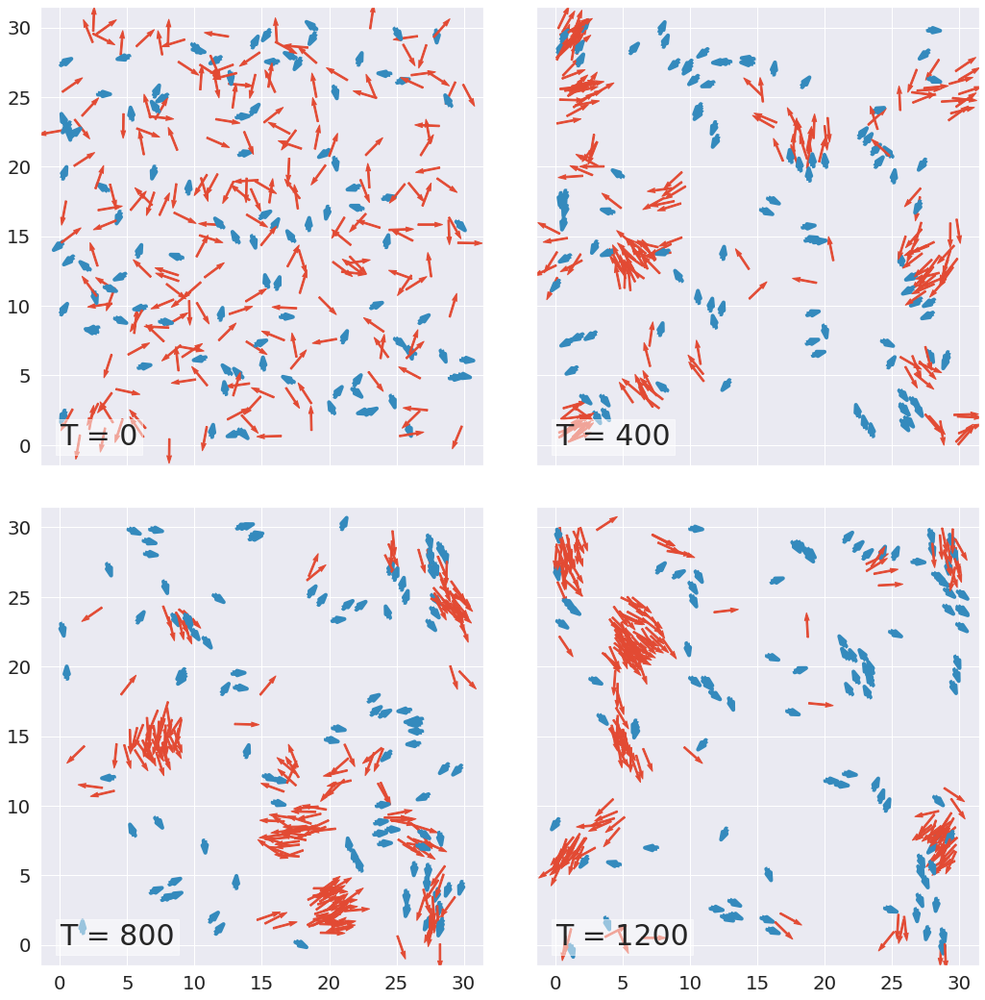

In [4]:
keys = list(frames.groups.keys())
sel = keys[::int((len(keys)-1)/3)]
fig, axs = plt.subplots(2,2,sharex=True,sharey=True, figsize=(15,15)) 
fig.tight_layout()
for ax, key in zip(axs.reshape(4), sel): 
    ss = frames.get_group(key)
    ax.quiver(ss.x, ss.y, ss.vx, ss.vy, color=ss.color, scale=18, ec=ss.color, fc=ss.color, lw=ss.lw)
    ax.text(0,0, "T = " + str(key), bbox=dict(facecolor='white', alpha=0.5), fontsize=30)

## Order Parameters

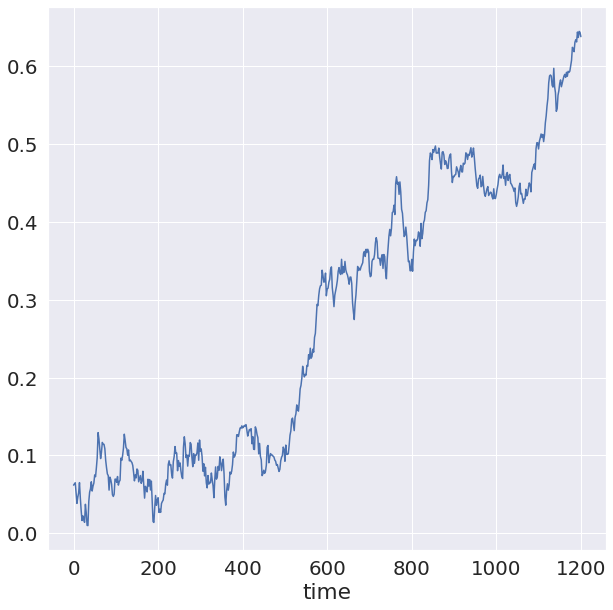

In [5]:
grp = viscek.groupby("time")["ox","oy"].mean()
grp["va"] = np.sqrt(grp.ox*grp.ox + grp.oy*grp.oy)
grp["va"].plot()

## Dynamic Figure

In [6]:
# First set up the figure, the axis, and the plot element we want to animate
# create empty plot for the update function to manipulate
fig, ax = plt.subplots(figsize=(8,8))
plot = ax.quiver(frames.get_group(0).x,frames.get_group(0).y,
                 frames.get_group(0).vx, frames.get_group(0).vy, 
                 color=frames.get_group(0).color, lw=frames.get_group(0).lw, 
                 ec=frames.get_group(0).color, fc=frames.get_group(0).color, 
                 width=0.004, scale_units='inches', scale=3)

# create an iterator over the group of frames, next() will return a tuple
iterator = iter(frames)

def init():
    ax.set_xlim(min(viscek.x)-0.5, max(viscek.x)+0.5)
    ax.set_ylim(min(viscek.y)-0.5, max(viscek.y)+0.5)
    return plot

def update(i):
    key, data = next(iterator)
    # set new x, y coordinates for the plot
    plot.set_offsets(np.column_stack([data.x, data.y]))
    # update vector and color values
    plot.set_UVC(data.vx, data.vy)

# create the animation, update every in
anim = animation.FuncAnimation(fig, update, init_func=init, interval=100, frames=len(frames))
plt.close()

# show data
#HTML(anim.to_jshtml())
HTML(anim.to_html5_video())